# **IoT Application - Visualization**

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

file_path = '../datasets/processed.csv'
file_path = '../datasets/air_df_correct_format.csv'
# file_path = './datasets/no_nmhc_correct_format.csv'
data = pd.read_csv(file_path, sep=";")

# Replace commas with dots in numeric values
data.replace(',', '.', regex=True, inplace=True)

In [52]:
# convert numeric columns to float
for col in data.columns[2:]:  # skip date and time
    data[col] = pd.to_numeric(data[col], errors='coerce')

# combine date and time into a datetime column
data['Datetime'] = pd.to_datetime(data['Date'] + ' ' + data['Time'], format='%d/%m/%Y %H.%M.%S', errors='coerce')

# drop rows with NaN in the datetime column
data.dropna(subset=['Datetime'], inplace=True)

# sort data by datetime
data.sort_values(by='Datetime', inplace=True)

# set datetime as the index
data.set_index('Datetime', inplace=True)

# keep only numeric columns
numeric_data = data.select_dtypes(include=['float64', 'int64'])

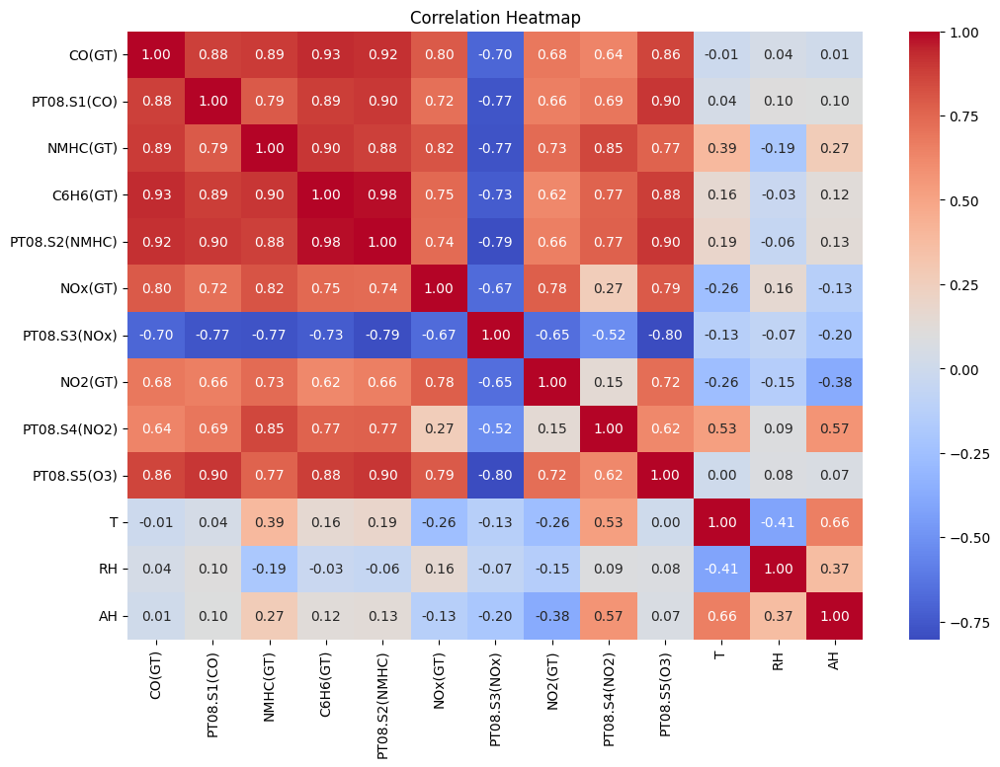

In [55]:
# Visualization 1: Correlation Heatmap
plt.figure(figsize=(12, 8))
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

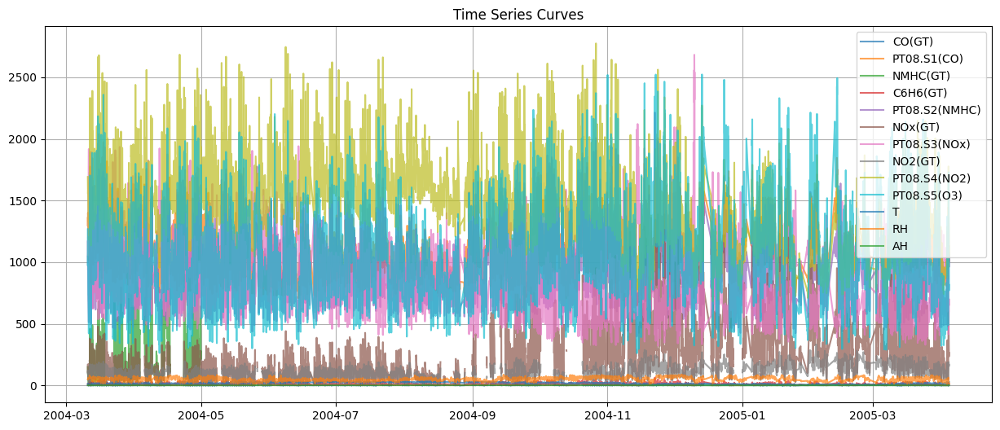

In [56]:
# Visualization 2: Time Series Curves
plt.figure(figsize=(15, 6))
for col in numeric_data.columns:
    plt.plot(numeric_data.index, numeric_data[col], label=col, alpha=0.7)
plt.title('Time Series Curves')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

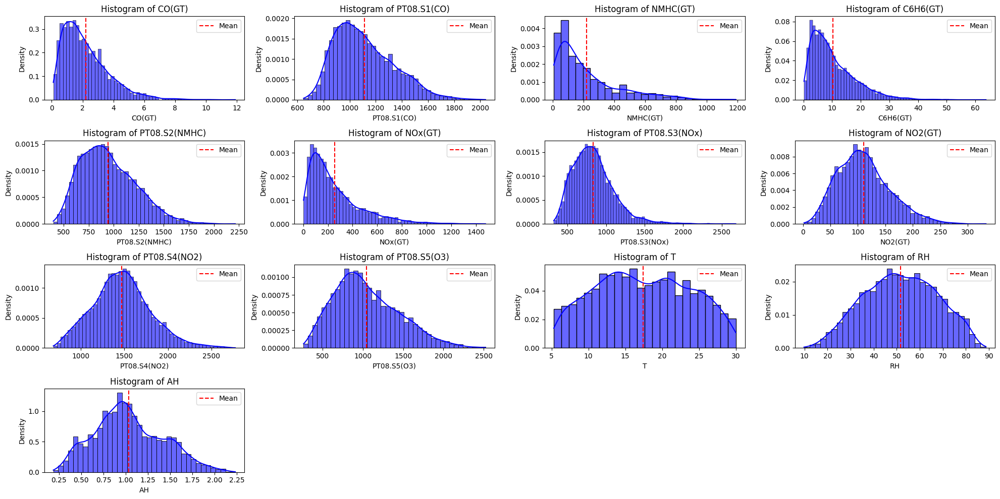

In [57]:
# Visualization 3: Histograms with Average Curves
plt.figure(figsize=(20, 10))
for i, col in enumerate(numeric_data.columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(numeric_data[col], kde=True, color='blue', alpha=0.6, stat='density')
    plt.axvline(numeric_data[col].mean(), color='red', linestyle='--', label='Mean')
    plt.title(f'Histogram of {col}')
    plt.legend()
plt.tight_layout()
plt.show()

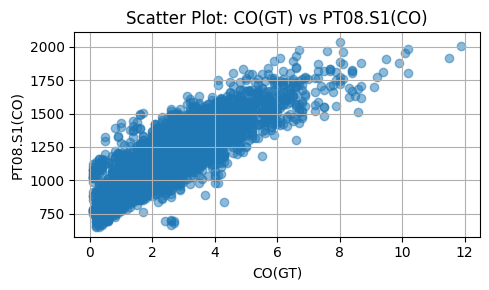

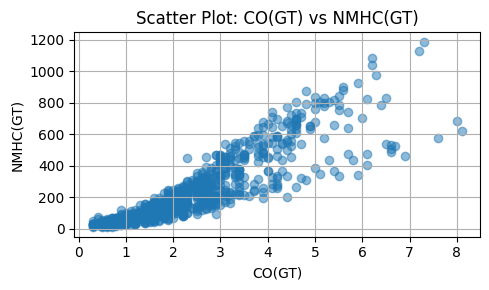

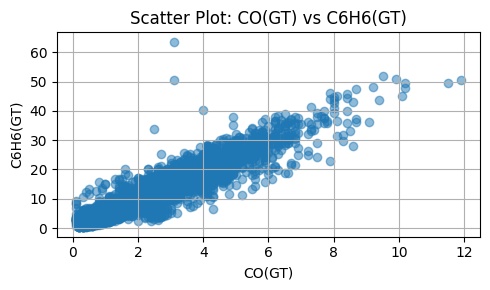

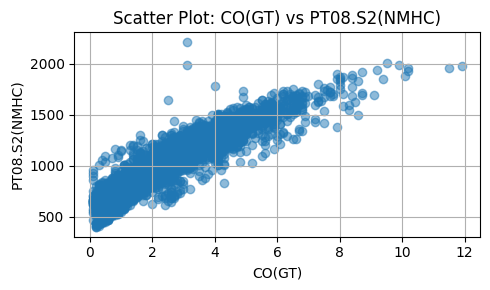

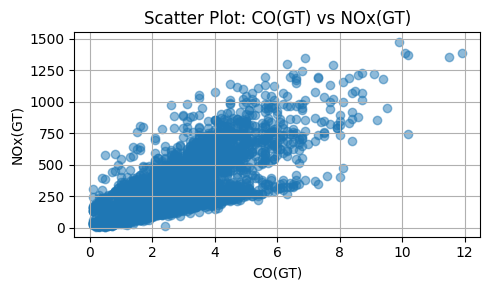

...

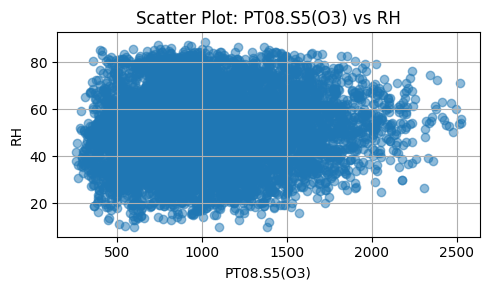

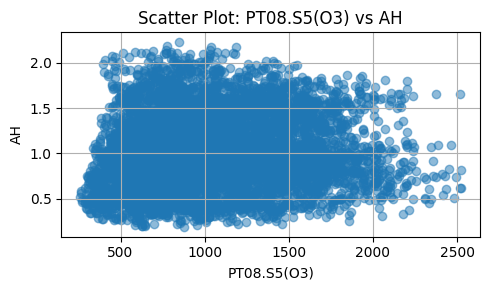

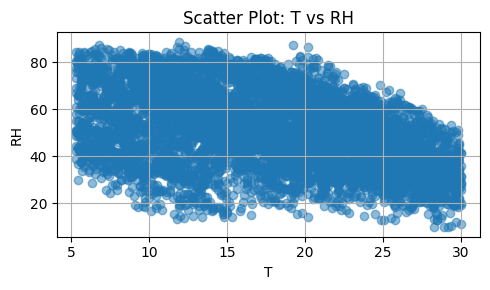

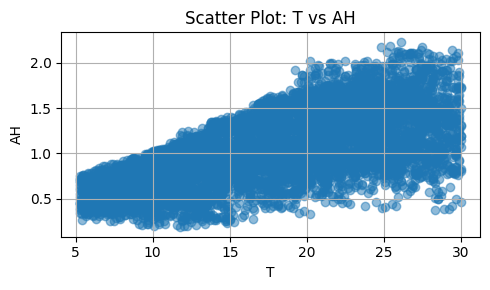

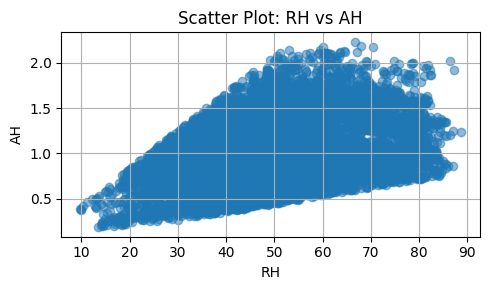

In [58]:
# Visualization 4: Scatter Plots for Pairwise Relationships (Separate Plots)
for i, col1 in enumerate(numeric_data.columns):
    for j, col2 in enumerate(numeric_data.columns):
        if i >= j:
            continue
        plt.figure(figsize=(10, 6))
        plt.scatter(numeric_data[col1], numeric_data[col2], alpha=0.5)
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.title(f'Scatter Plot: {col1} vs {col2}')
        plt.grid(True)        
        fig = plt.gcf()
        fig.set_size_inches(5, 3)
        plt.tight_layout()
        plt.show()
        # Save the scatter plot image
        fig.savefig(f"../output_plots/scatter/scatter_{col1}_vs_{col2}.png")

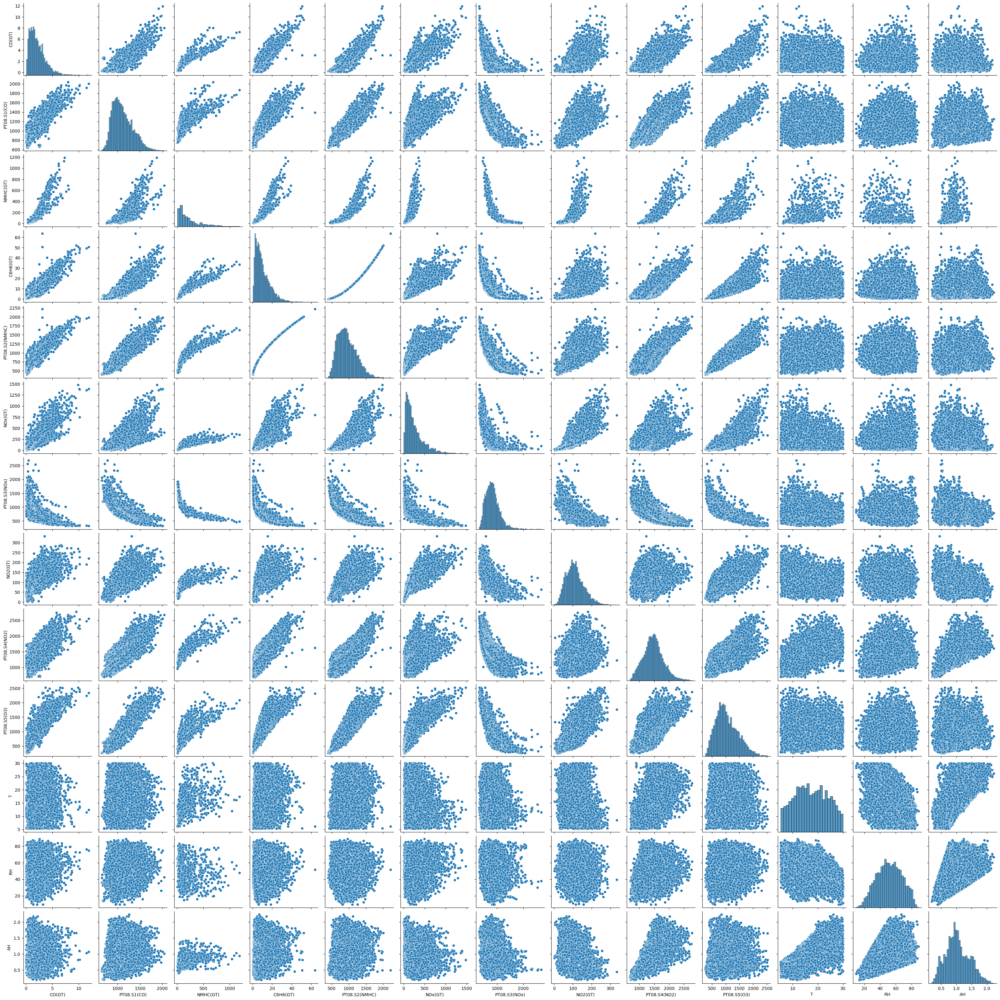

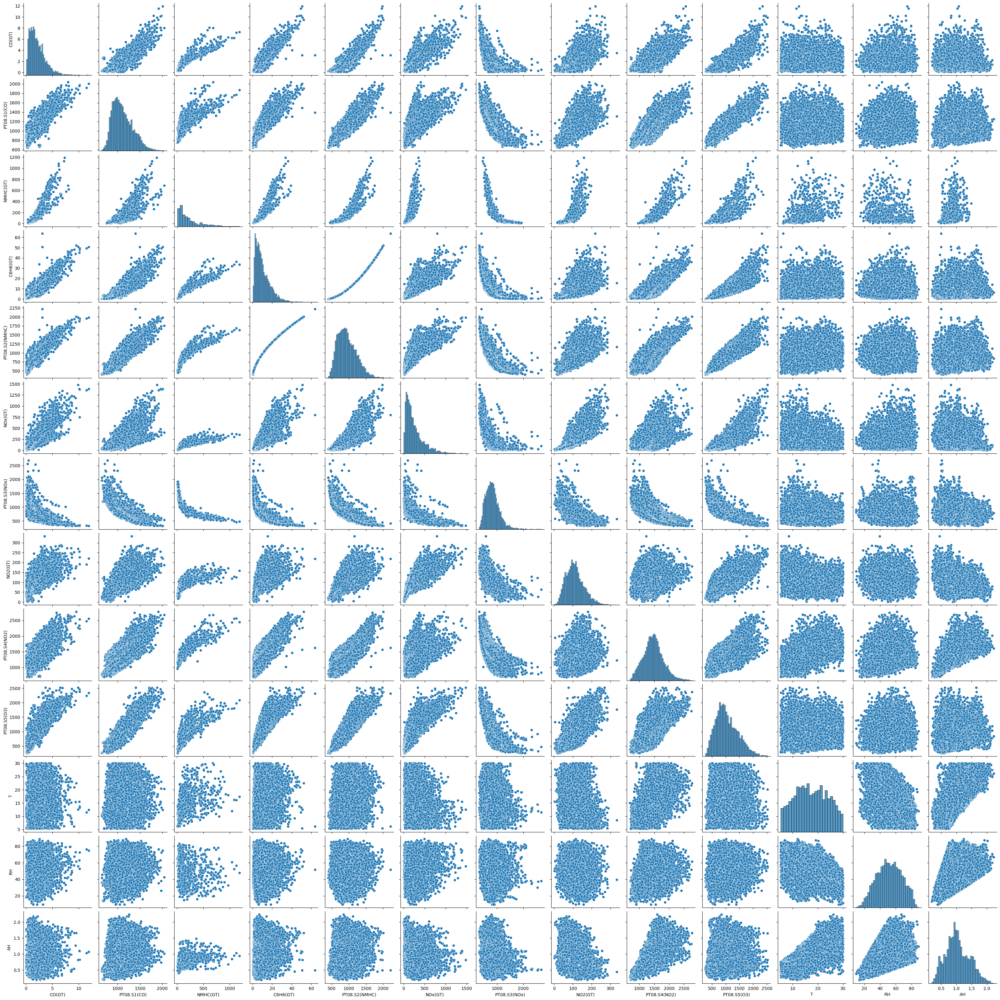

In [59]:
# Visualization 5: Pair Plot
sns.pairplot(numeric_data)
plt.show()
# Save the pair plot image
pair_plot = sns.pairplot(numeric_data)
pair_plot.savefig("../output_plots/pair_plot.png")

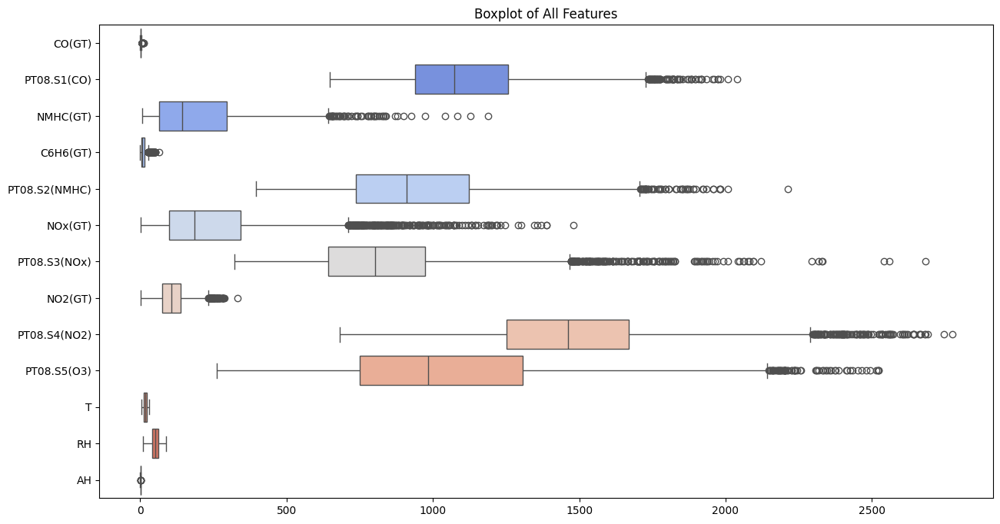

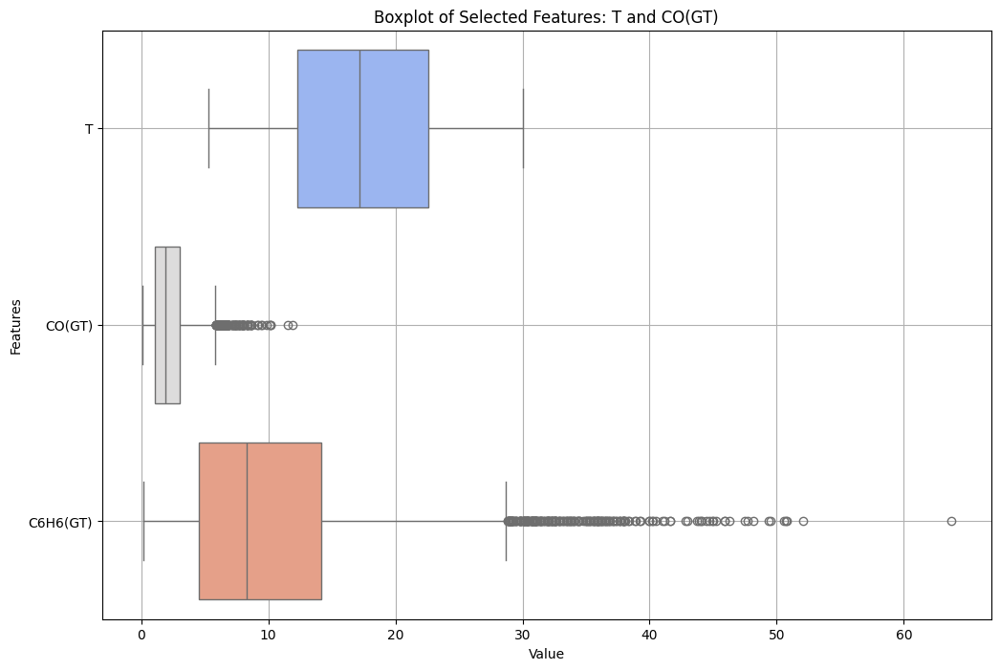

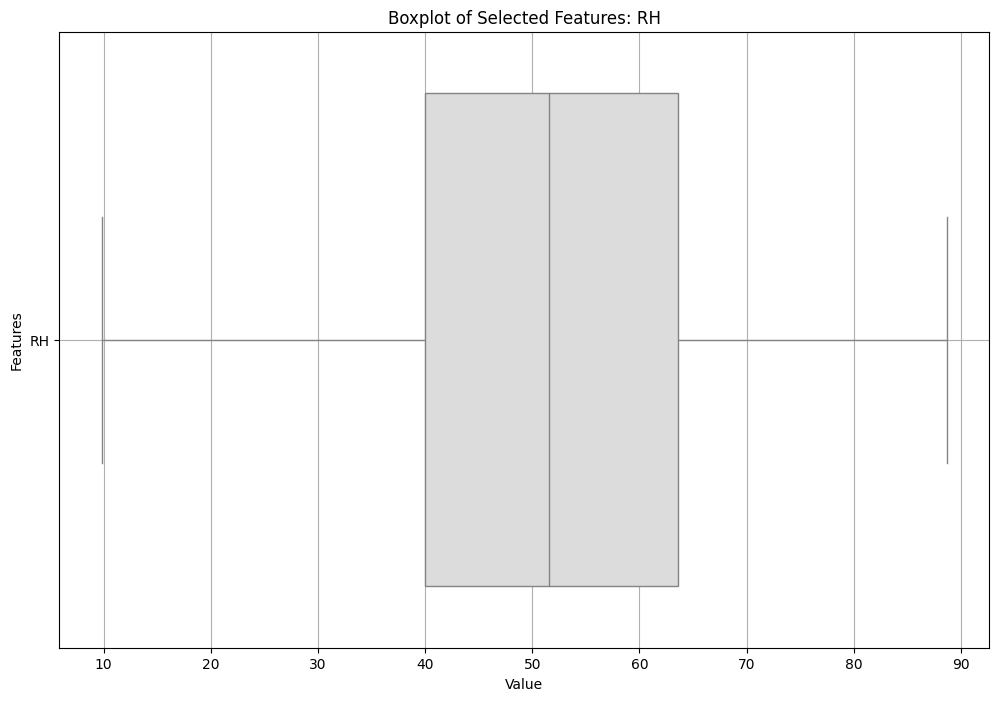

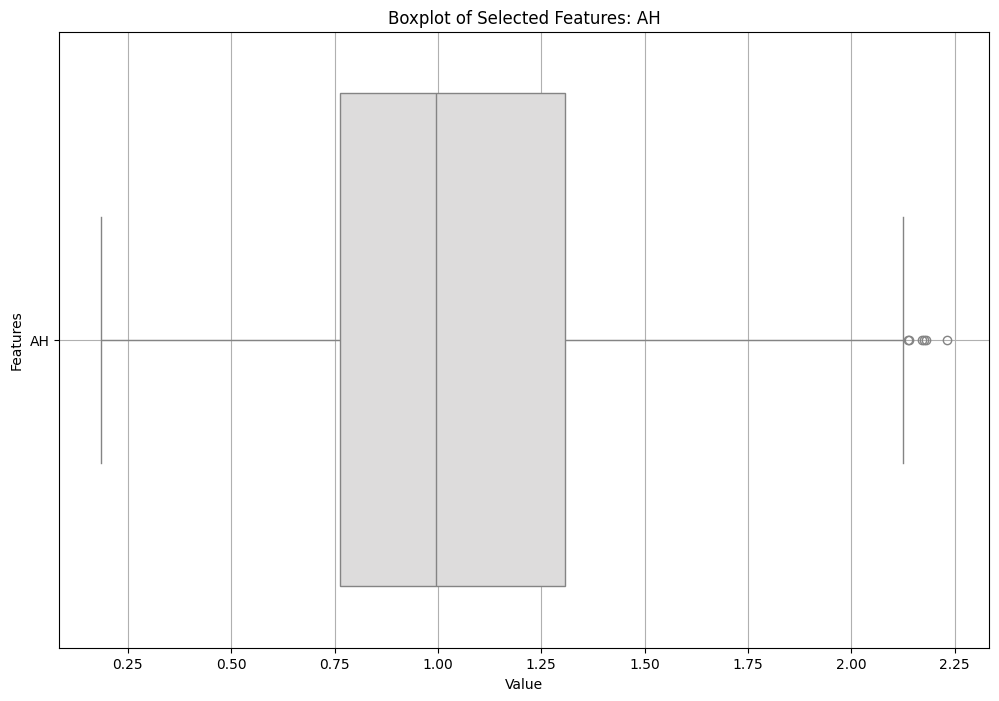

In [60]:
# Visualization 6: Boxplots for Distributions
plt.figure(figsize=(15, 8))
sns.boxplot(data=numeric_data, orient='h', palette='coolwarm')
plt.title('Boxplot of All Features')
plt.show()

# ["T", "CO(GT)", "C6H6(GT)"]
plt.figure(figsize=(12, 8))
sns.boxplot(data=numeric_data[["T", "CO(GT)", "C6H6(GT)"]], palette='coolwarm', orient='h')
plt.title('Boxplot of Selected Features: T and CO(GT)')
plt.xlabel('Value')
plt.ylabel('Features')
plt.grid(True)
plt.show()

# ["RH"]
plt.figure(figsize=(12, 8))
sns.boxplot(data=numeric_data[["RH"]], palette='coolwarm', orient='h')
plt.title('Boxplot of Selected Features: RH')
plt.xlabel('Value')
plt.ylabel('Features')
plt.grid(True)
plt.show()

# ["AH"]
plt.figure(figsize=(12, 8))
sns.boxplot(data=numeric_data[["AH"]], palette='coolwarm', orient='h')
plt.title('Boxplot of Selected Features: AH')
plt.xlabel('Value')
plt.ylabel('Features')
plt.grid(True)
plt.show()

